In [54]:
import os
import random
import torchaudio
import torch
import librosa
from concurrent.futures import ProcessPoolExecutor, as_completed
from pprint import pprint
from tqdm import tqdm
import time
import numpy as np
from scipy import signal
from transformers import AutoFeatureExtractor

In [55]:
#create a list with names of cricket audio file: raw data (later to be used to shuffle and use them as train and test data)
wav_dir = "/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_audio/wav_audio/"
wav_files_list = sorted(file for file in os.listdir(wav_dir) if os.path.isfile(os.path.join(wav_dir, file)))


In [56]:
print(len(wav_files_list))

441


#Preprocess the data


In [61]:
torch.set_num_threads(1)
SR = 16000
SECONDS_TO_OVERLAP = 5
SECONDS_TO_TRIM= 10
NUM_PROCESS = 8

In [62]:
# load the model and utilities for VAD ( voice activity detection)
def get_model_and_utils():
    model, utils = torch.hub.load(repo_or_dir='snakers4/silero-vad',
                                   model='silero_vad',
                                   force_reload=False,
                                   onnx=False,
                                   verbose=False)
    return model, utils

In [63]:
#load the 'silero_vad' model and its associated utilities
model, utils = get_model_and_utils()
(get_speech_timestamps, save_audio, read_audio, VADIterator, collect_chunks) = utils


#Preprocess

In [64]:
#detremine the label of wav files ( genus name, species name MCL/SINA)
def determine_label_name(wav_file):
    if wav_file.find("Xenogryllus") != -1 and wav_file.find("(MCL)") != -1:
        return "Xenogryllus" + " " + "unipartitus" + " " + "MCL"
    else:
        split_file = wav_file.split(" ")
        if wav_file.find("MCL") != -1:
            return split_file[2] + " " + split_file[3] + " " + "MCL"
        else:
            return split_file[2] + " " + split_file[3] + " " + "SINA"

In [65]:
# Load the wav file and change the SR to 16000 (AST uses SR 16000)
def load_wav_file(wav_file):
    wavform,sample_rate = librosa.load(wav_dir + wav_file)
    #wav, sample_rate = torchaudio.load(os.path.join(wav_dir, wav_file))
    wav = torch.from_numpy(wavform)
    wav = wav.mean(dim=0) if wav.ndim > 1 else wav
    if sample_rate != 16000:
        resample_transform = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
        wav = resample_transform(wav)
    return wav


In [66]:
#extract the 10 sec segments with 5 seconds overlap
def extract_data_chunks(wav, label_name):
    data = []
    for i in range(0, len(wav), SECONDS_TO_OVERLAP * SR):
        if i + SECONDS_TO_TRIM * SR < len(wav):
            waveform = wav[i: i + SECONDS_TO_TRIM * SR]
            data.append({"array": waveform.squeeze().numpy(), "label": label_name})
        else:
            waveform = wav[i: len(wav)]
            if len(waveform) < 10 * SR:
                continue
            else:
                data.append({"array": waveform.squeeze().numpy(), "label": label_name})
    return data

In [67]:
# drop the timestamps from audio file where human voice is detected
def drop_chunks(tss, wav):
    if len(tss) == 0:
        return wav
    chunks = []
    cur_start = 0
    for i in tss:
        chunks.append((wav[cur_start: i['start']]))
        cur_start = i['end']
    # Append the remaining part of the wav tensor after the last segment
    chunks.append(wav[cur_start:])
    return torch.cat(chunks)

In [68]:
# Pre-process the audio wav files 
def process_wav_file(wav_file: str):
    # print("Processing file: " + wav_file)
    model, utils = get_model_and_utils()
    (get_speech_timestamps, save_audio, read_audio, VADIterator, collect_chunks) = utils

    label_name = determine_label_name(wav_file)
    wav = load_wav_file(wav_file)
    with torch.no_grad():
        speech_timestamps = get_speech_timestamps(wav, model, sampling_rate=SR)
    final_wav = drop_chunks(speech_timestamps, wav)
    if(len(final_wav) < 1 * SR):
        print("Getting no data from : ",wav_file)
    wav = final_wav[SR:-SR]

    return extract_data_chunks(wav, label_name)
    #final_wav.unsqueeze(0)
    # return wav.unsqueeze(0),label_name

In [69]:
# train and test text files store the audio filenames .Read the file names to process the corresponding audio files
def read_wav_files_from_txt_file(txt_file):
    with open(txt_file, 'r') as file:
        wav_files = [line.strip() for line in file.readlines()]
    return wav_files

In [70]:
#preprocess the data VAD preprocessing (to remove human voice over)
def preprocess_data(data_path):
    futures = []
    data = []
    wav_files_list = read_wav_files_from_txt_file(data_path)
    print(len(wav_files_list))
    with ProcessPoolExecutor(max_workers=NUM_PROCESS) as ex:
        for wav_file in wav_files_list:
            futures.append(ex.submit(process_wav_file, wav_file))
    
        for finished in tqdm(as_completed(futures), total=len(futures), desc="Processing WAV files"):
            result = finished.result()
            data.extend(result)
            
    return data

In [15]:
#Add band pass filter to the VAD processed waveforms (to remove any extra noise like phone ringing)


def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y

In [16]:
def filter_data_noise(data):
    all_filtered_samples = []
    for i in tqdm(range(len(data))):
      waveform = data[i]['array']
      filtered = butter_highpass_filter(waveform,2000,SR)
      filtered_samples = {'array': filtered,'label':data[i]['label']}
      all_filtered_samples.append(filtered_samples)

    return all_filtered_samples

In [60]:
#raw data before splitting into train and test
#preprocess raw ata for all 26 genus
raw_path = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/raw_data.txt'
data_raw = preprocess_data(raw_path)
pprint(len(data_raw))

#filter the extra data noise on top of VAD processing raw data for all genus
filtered_data_raw = filter_data_noise(data_raw)
print(len(filtered_data_raw))
print(filtered_data_raw[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_raw = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/raw_all_genus/"
torch.save(filtered_data_raw, save_raw + "data.pt")


441


Processing WAV files:   0%|                             | 0/441 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius fasciatus (SINA).mp3


Processing WAV files:   2%|▍                    | 9/441 [00:14<04:56,  1.46it/s]

Getting no data from :  Copy of Allonemobius fasciatus 1 (MCL).WAV


Processing WAV files:   3%|▌                   | 13/441 [00:16<03:15,  2.19it/s]

Getting no data from :  Copy of Allonemobius fasciatus 2 (MCL).WAV


Processing WAV files:   4%|▊                   | 19/441 [00:19<03:24,  2.06it/s]

Getting no data from :  Copy of Allonemobius griseus 2 (MCL).WAV


Processing WAV files:   6%|█▏                  | 25/441 [00:21<02:07,  3.27it/s]

Getting no data from :  Copy of Allonemobius socius (SINA).mp3


Processing WAV files:   8%|█▋                  | 37/441 [00:25<02:12,  3.05it/s]

Getting no data from :  Copy of Allonemobius tinnulus 2 (MCL).WAV


Processing WAV files:  46%|████████▊          | 205/441 [01:19<01:23,  2.82it/s]

Getting no data from :  Copy of Gryllus cayensis (SINA).mp3


Processing WAV files: 100%|███████████████████| 441/441 [03:15<00:00,  2.26it/s]


3769


100%|██████████████████████████████████████| 3769/3769 [00:15<00:00, 244.55it/s]


3769
{'array': array([-4.66497062e-04, -4.24649563e-01,  2.60648716e-01, ...,
        3.36095536e-02,  1.09293574e-02, -4.31583744e-06]), 'label': 'Allonemobius allardi MCL'}


In [16]:
#train
#preprocess train data for 11_genus
train_path_11 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/11_genus/train.txt'
data_train_11 = preprocess_data(train_path_11)
pprint(len(data_train_11))

#filter the extra data noise on top of VAD processing train data for 5 genus
filtered_data_train_11 = filter_data_noise(data_train_11)
print(len(filtered_data_train_11))
print(filtered_data_train_11[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_train_11 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/11_genus/train/"
torch.save(filtered_data_train_11, save_train_11 + "data.pt")


294


Processing WAV files:   0%|                             | 0/294 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius socius (SINA).mp3


Processing WAV files:   4%|▋                   | 11/294 [00:29<03:39,  1.29it/s]

Getting no data from :  Copy of Allonemobius fasciatus 2 (MCL).WAV


Processing WAV files:   9%|█▊                  | 27/294 [00:35<01:19,  3.34it/s]

Getting no data from :  Copy of Allonemobius tinnulus 2 (MCL).WAV


Processing WAV files:  10%|█▉                  | 29/294 [00:35<01:27,  3.04it/s]

Getting no data from :  Copy of Allonemobius fasciatus 1 (MCL).WAV


Processing WAV files: 100%|███████████████████| 294/294 [02:36<00:00,  1.88it/s]


2326


100%|██████████████████████████████████████| 2326/2326 [00:09<00:00, 251.30it/s]


2326
{'array': array([ 2.69462726e-06,  3.02307257e-03,  4.77101332e-04, ...,
       -1.03855309e-02, -1.11632788e-02,  2.73727227e-04]), 'label': 'Allonemobius tinnulus SINA'}


In [17]:
#test
#preprocess test data for 11_genus
test_path_11 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/11_genus/test.txt'
data_test_11 = preprocess_data(test_path_11)
pprint(len(data_test_11))

#filter the extra data noise on top of VAD processing test data for 11 genus
filtered_data_test_11 = filter_data_noise(data_test_11)
print(len(filtered_data_test_11))
print(filtered_data_test_11[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_test_11 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/11_genus/test/"
torch.save(filtered_data_test_11, save_test_11 + "data.pt")


79


Processing WAV files:   0%|                              | 0/79 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius griseus 2 (MCL).WAV


Processing WAV files: 100%|█████████████████████| 79/79 [00:49<00:00,  1.59it/s]


578


100%|████████████████████████████████████████| 578/578 [00:02<00:00, 288.39it/s]


578
{'array': array([-4.66497062e-04, -4.24649563e-01,  2.60648716e-01, ...,
        3.36095536e-02,  1.09293574e-02, -4.31583744e-06]), 'label': 'Allonemobius allardi MCL'}


In [30]:
#train 
#preprocess train data for 5_genus
train_path_5 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/5_genus/train.txt'
data_train_5 = preprocess_data(train_path_5)
pprint(len(data_train_5))

#filter the extra data noise on top of VAD processing train data for 5 genus
filtered_data_train_5 = filter_data_noise(data_train_5)
print(len(filtered_data_train_5))
print(filtered_data_train_5[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_train_5 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/5_genus/train/"
torch.save(filtered_data_train_5, save_train_5 + "data.pt")



223


Processing WAV files:   0%|                             | 0/223 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius fasciatus 1 (MCL).WAV


Processing WAV files:   1%|▎                    | 3/223 [00:05<04:42,  1.28s/it]

Getting no data from :  Copy of Allonemobius fasciatus 2 (MCL).WAV


Processing WAV files:   7%|█▍                  | 16/223 [00:10<01:42,  2.02it/s]

Getting no data from :  Copy of Allonemobius tinnulus 2 (MCL).WAV


Processing WAV files:   9%|█▊                  | 20/223 [00:13<01:57,  1.73it/s]

Getting no data from :  Copy of Allonemobius griseus 2 (MCL).WAV


Processing WAV files: 100%|███████████████████| 223/223 [02:02<00:00,  1.82it/s]


1980


100%|██████████████████████████████████████| 1980/1980 [00:07<00:00, 257.99it/s]


1980
{'array': array([-2.55864611e-06,  1.66992632e-03,  2.57115443e-03, ...,
       -1.57988889e-02,  3.27346642e-02,  2.69330569e-04]), 'label': 'Allonemobius shalontaki SINA'}


In [17]:
#For testing with new increased sample size. 5 seconds trim with 3 seconds overlap
#train
#preprocess train data for 5_genus
train_path_5 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/5_genus/train.txt'
data_train_5 = preprocess_data(train_path_5)
pprint(len(data_train_5))

#filter the extra data noise on top of VAD processing train data for 5 genus
filtered_data_train_5 = filter_data_noise(data_train_5)
print(len(filtered_data_train_5))
print(filtered_data_train_5[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_train_5 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/5_genus/5sectrim_3secoverlap/train/"
torch.save(filtered_data_train_5, save_train_5 + "data.pt")


223


Processing WAV files:   0%|                             | 0/223 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius fasciatus 1 (MCL).WAV


Processing WAV files:   1%|▎                    | 3/223 [00:12<10:30,  2.87s/it]

Getting no data from :  Copy of Allonemobius fasciatus 2 (MCL).WAV


Processing WAV files:   8%|█▌                  | 17/223 [00:17<01:31,  2.25it/s]

Getting no data from :  Copy of Allonemobius tinnulus 2 (MCL).WAV


Processing WAV files:   9%|█▊                  | 20/223 [00:20<02:34,  1.31it/s]

Getting no data from :  Copy of Allonemobius griseus 2 (MCL).WAV


Processing WAV files: 100%|███████████████████| 223/223 [02:10<00:00,  1.71it/s]


3596


100%|██████████████████████████████████████| 3596/3596 [00:07<00:00, 482.47it/s]


3596
{'array': array([-2.55864611e-06,  1.66992632e-03,  2.57115443e-03, ...,
       -4.07264457e-04,  4.17074684e-04, -7.29254857e-06]), 'label': 'Allonemobius shalontaki SINA'}


In [31]:
#test
#preprocess test data for 5_genus
test_path_5 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/5_genus/test.txt'
data_test_5 = preprocess_data(test_path_5)
pprint(len(data_test_5))

#filter the extra data noise on top of VAD processing test data for 5 genus
filtered_data_test_5 = filter_data_noise(data_test_5)
print(len(filtered_data_test_5))
print(filtered_data_test_5[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_test_5 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/5_genus/test/"
torch.save(filtered_data_test_5, save_test_5 + "data.pt")


58


Processing WAV files:   0%|                              | 0/58 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius socius (SINA).mp3


Processing WAV files: 100%|█████████████████████| 58/58 [00:26<00:00,  2.21it/s]


403


100%|████████████████████████████████████████| 403/403 [00:01<00:00, 249.78it/s]


403
{'array': array([-4.66497062e-04, -4.24649563e-01,  2.60648716e-01, ...,
        3.36095536e-02,  1.09293574e-02, -4.31583744e-06]), 'label': 'Allonemobius allardi MCL'}


In [17]:
#3 genus
#train
#preprocess train data for 3 genus
train_path_3 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/3_genus/train.txt'
data_train_3 = preprocess_data(train_path_3)
pprint(len(data_train_3))

#filter the extra data noise on top of VAD processing train data for 3 genus
filtered_data_train_3 = filter_data_noise(data_train_3)
print(len(filtered_data_train_3))
print(filtered_data_train_3[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_train_3 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/3_genus/train/"
torch.save(filtered_data_train_3, save_train_3 + "data.pt")



163


Processing WAV files:   0%|                             | 0/163 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

1557


100%|██████████████████████████████████████| 1557/1557 [00:06<00:00, 256.30it/s]


1557
{'array': array([ 1.11245043e-05, -2.33305430e-02,  2.43914146e-03, ...,
       -6.04537518e-04,  1.54267414e-03,  2.07218245e-05]), 'label': 'Cycloptilum albocircum SINA'}


In [18]:
#3 genus
#test
#preprocess test data for 3_genus
test_path_3 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/3_genus/test.txt'
data_test_3 = preprocess_data(test_path_3)
pprint(len(data_test_3))

#filter the extra data noise on top of VAD processing test data for 3 genus
filtered_data_test_3 = filter_data_noise(data_test_3)
print(len(filtered_data_test_3))
print(filtered_data_test_3[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_test_3 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/3_genus/test/"
torch.save(filtered_data_test_3, save_test_3 + "data.pt")


42


Processing WAV files:   0%|                              | 0/42 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

227


100%|████████████████████████████████████████| 227/227 [00:00<00:00, 276.22it/s]


227
{'array': array([ 2.81995700e-07,  2.97140524e-04, -4.95761290e-05, ...,
       -2.25819965e-04,  3.95273473e-04, -5.18465455e-06]), 'label': 'Cycloptilum slossoni SINA'}


In [58]:
#8 genus
#train
#preprocess train data for 8_genus
train_path_8 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/8_genus/train.txt'
data_train_8 = preprocess_data(train_path_8)
pprint(len(data_train_8))

#filter the extra data noise on top of VAD processing train data for 8 genus
filtered_data_train_8 = filter_data_noise(data_train_8)
print(len(filtered_data_train_8))
print(filtered_data_train_8[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_train_8 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/8_genus/train/"
torch.save(filtered_data_train_8, save_train_8 + "data.pt")



264


Processing WAV files:   0%|                             | 0/264 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius socius (SINA).mp3


Processing WAV files:   2%|▍                    | 5/264 [00:12<06:21,  1.47s/it]

Getting no data from :  Copy of Allonemobius tinnulus 2 (MCL).WAV


Processing WAV files:   3%|▌                    | 7/264 [00:14<04:35,  1.07s/it]

Getting no data from :  Copy of Allonemobius fasciatus 1 (MCL).WAV


Processing WAV files:  12%|██▎                 | 31/264 [00:23<01:29,  2.62it/s]

Getting no data from :  Copy of Allonemobius griseus 2 (MCL).WAV


Processing WAV files: 100%|███████████████████| 264/264 [02:23<00:00,  1.84it/s]


2089


100%|██████████████████████████████████████| 2089/2089 [00:08<00:00, 249.96it/s]


2089
{'array': array([ 2.82536964e-06,  6.15688928e-03, -4.17979605e-03, ...,
       -3.47103225e-02,  4.69563085e-02,  2.66830674e-04]), 'label': 'Allonemobius allardi SINA'}


In [59]:
#8 genus
#test
#preprocess test data for 8_genus
test_path_8 = r'/gpfs/proj1/choe_lab/tanu/Genus_classification/raw_data/8_genus/test.txt'
data_test_8 = preprocess_data(test_path_8)
pprint(len(data_test_8))

#filter the extra data noise on top of VAD processing test data for 8 genus
filtered_data_test_8 = filter_data_noise(data_test_8)
print(len(filtered_data_test_8))
print(filtered_data_test_8[0])

#save the test VAD and band pass filtered data as .pt(pickle file)
save_test_8 = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/8_genus/test/"
torch.save(filtered_data_test_8, save_test_8 + "data.pt")


70


Processing WAV files:   0%|                              | 0/70 [00:00<?, ?it/s]/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/csrc/graph_fuser.cpp:104.)
  return forward_call(*args, **kwargs)
/gpfs/proj1/choe_lab/tanu/venv/jupyter/lib/python3.8/site-packages/torch/nn/modules/module.py:1501: UserWarning: operator() profile_node %669 : int[] = prim::profile_ivalue(%667)
 does not have profile information (Triggered internally at ../third_party/nvfuser/cs

Getting no data from :  Copy of Allonemobius fasciatus 2 (MCL).WAV


Processing WAV files: 100%|█████████████████████| 70/70 [00:35<00:00,  2.00it/s]


514


100%|████████████████████████████████████████| 514/514 [00:01<00:00, 281.09it/s]


514
{'array': array([-2.55864611e-06,  1.66992632e-03,  2.57115443e-03, ...,
       -1.57988889e-02,  3.27346642e-02,  2.69330569e-04]), 'label': 'Allonemobius shalontaki SINA'}


#Feature extraction

In [72]:
%%capture
pip install transformers

In [73]:
import torch
import numpy as np
from transformers import AutoFeatureExtractor
from tqdm import tqdm



In [74]:
feature_extractor = AutoFeatureExtractor.from_pretrained(
    "MIT/ast-finetuned-audioset-10-10-0.4593"
)

In [76]:
def process_samples_in_batches(samples, batch_size):
    all_processed_samples = []
    num_samples = len(samples)
    print("number of samples", num_samples)
    num_batches = int(np.ceil(num_samples / float(batch_size)))
    print("number of batches", num_batches)

    for i in tqdm(range(num_batches), desc="Processing batches"):
        start = i * batch_size
        end = min(start + batch_size, num_samples)
        batch_samples = samples[start:end]

        arrays = [sample['array'] for sample in batch_samples]
        inputs = feature_extractor(
            arrays, sampling_rate=16000, return_tensors="np"
        )
        for input_values, sample in zip(inputs['input_values'], batch_samples):
            processed_sample = {
                'array': input_values,
                'label': sample['label']
            }
            all_processed_samples.append(processed_sample)
    return all_processed_samples

def main(input_dir, output_dir, batch_size=16):
    samples = torch.load(input_dir)
    all_processed_samples = process_samples_in_batches(samples, batch_size)
    print("len of all_processed_samples: ", len(all_processed_samples))
    print("shape of all_processed_samples: ", all_processed_samples[0]['array'].shape, all_processed_samples[0]['label'])
    torch.save(all_processed_samples, output_dir + 'cricket_data_feature_extracted.pt')




In [77]:
#testing for getting mel image

all_processed_samples = process_samples_in_batches(data_train_11, batch_size=16)
print("len of all_processed_samples: ", len(all_processed_samples))
print("shape of all_processed_samples: ", all_processed_samples[0]['array'].shape, all_processed_samples[0]['label'])
#torch.save(all_processed_samples, output_dir + 'cricket_data_feature_extracted.pt')

number of samples 2326
number of batches 146


Processing batches: 100%|█████████████████████| 146/146 [00:15<00:00,  9.35it/s]

len of all_processed_samples:  2326
shape of all_processed_samples:  (1024, 128) Allonemobius tinnulus SINA


In [65]:
#all raw genus  data features extraction

data_path_all = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/raw_all_genus/data.pt"
output_path_all = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/raw_all_genus/"
batch_size = 16
main(data_path_all, output_path_all, batch_size)

number of samples 3769
number of batches 236


Processing batches: 100%|█████████████████████| 236/236 [00:28<00:00,  8.35it/s]


len of all_processed_samples:  3769
shape of all_processed_samples:  (1024, 128) Allonemobius allardi MCL


In [22]:
#11 genus train data features extraction

data_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/11_genus/train/data.pt"
output_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/11_genus/train/"
batch_size = 16
main(data_path_train, output_path_train, batch_size)

number of samples 2326
number of batches 146


Processing batches: 100%|█████████████████████| 146/146 [00:15<00:00,  9.64it/s]


len of all_processed_samples:  2326
shape of all_processed_samples:  (1024, 128) Allonemobius tinnulus SINA


In [23]:
#11 genus test data feature extraction
data_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/11_genus/test/data.pt"
output_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/11_genus/test/"
batch_size = 16
main(data_path_test, output_path_test, batch_size)

number of samples 578
number of batches 37


Processing batches: 100%|███████████████████████| 37/37 [00:02<00:00, 13.94it/s]


len of all_processed_samples:  578
shape of all_processed_samples:  (1024, 128) Allonemobius allardi MCL


In [41]:
#5 genus features extraction

data_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/5_genus/train/data.pt"
output_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/5_genus/train/"
batch_size = 16
main(data_path_train, output_path_train, batch_size)

number of samples 1980
number of batches 124


Processing batches: 100%|█████████████████████| 124/124 [00:12<00:00, 10.23it/s]


len of all_processed_samples:  1980
shape of all_processed_samples:  (1024, 128) Allonemobius shalontaki SINA


In [42]:
#5 genus test data feature extraction
data_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/5_genus/test/data.pt"
output_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/5_genus/test/"
batch_size = 16
main(data_path_test, output_path_test, batch_size)

number of samples 403
number of batches 26


Processing batches: 100%|███████████████████████| 26/26 [00:01<00:00, 13.79it/s]


len of all_processed_samples:  403
shape of all_processed_samples:  (1024, 128) Allonemobius allardi MCL


In [27]:
#3 genus train features extraction

data_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/3_genus/train/data.pt"
output_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/3_genus/train/"
batch_size = 16
main(data_path_train, output_path_train, batch_size)

number of samples 1557
number of batches 98


Processing batches: 100%|███████████████████████| 98/98 [00:08<00:00, 12.12it/s]


len of all_processed_samples:  1557
shape of all_processed_samples:  (1024, 128) Cycloptilum albocircum SINA


In [28]:
#3 genus test data feature extraction
data_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/3_genus/test/data.pt"
output_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/3_genus/test/"
batch_size = 16
main(data_path_test, output_path_test, batch_size)

number of samples 227
number of batches 15


Processing batches: 100%|███████████████████████| 15/15 [00:00<00:00, 15.30it/s]


len of all_processed_samples:  227
shape of all_processed_samples:  (1024, 128) Cycloptilum slossoni SINA


In [64]:
#8 genus features extraction

data_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/8_genus/train/data.pt"
output_path_train = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/8_genus/train/"
batch_size = 16
main(data_path_train, output_path_train, batch_size)

number of samples 2089
number of batches 131


Processing batches: 100%|█████████████████████| 131/131 [00:11<00:00, 11.14it/s]


len of all_processed_samples:  2089
shape of all_processed_samples:  (1024, 128) Allonemobius allardi SINA


In [65]:
#8 genus test data feature extraction
data_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/pre_processed/8_genus/test/data.pt"
output_path_test = "/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/8_genus/test/"
batch_size = 16
main(data_path_test, output_path_test, batch_size)

number of samples 514
number of batches 33


Processing batches: 100%|███████████████████████| 33/33 [00:02<00:00, 13.05it/s]


len of all_processed_samples:  514
shape of all_processed_samples:  (1024, 128) Allonemobius shalontaki SINA


In [52]:
data_path_features = r"/gpfs/proj1/choe_lab/tanu/Genus_classification/features_extracted/raw_all_genus/cricket_data_feature_extracted.pt"
samples = torch.load(data_path_features)


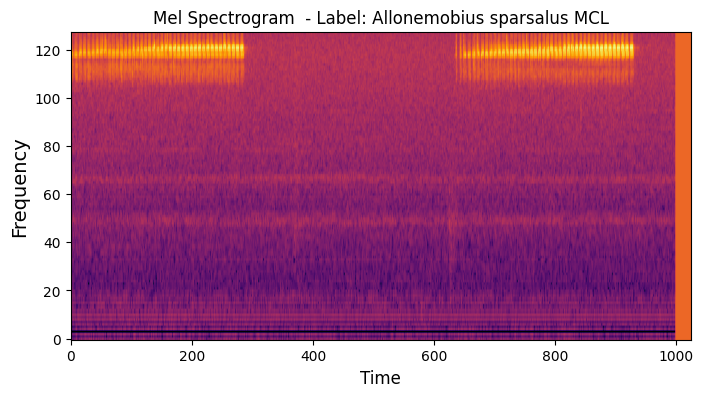

In [81]:

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
plt.imshow(all_processed_samples[39]['array'].T, cmap='inferno', aspect='auto', origin='lower')
plt.title(f"Mel Spectrogram  - Label: {all_processed_samples[39]['label']}")
plt.xlabel('Time', fontsize=12)
plt.ylabel('Frequency', fontsize=14)

plt.savefig('Allonemobius_Sparsalus_sample38.png')

/tmp/ipykernel_773173/603481079.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 4))


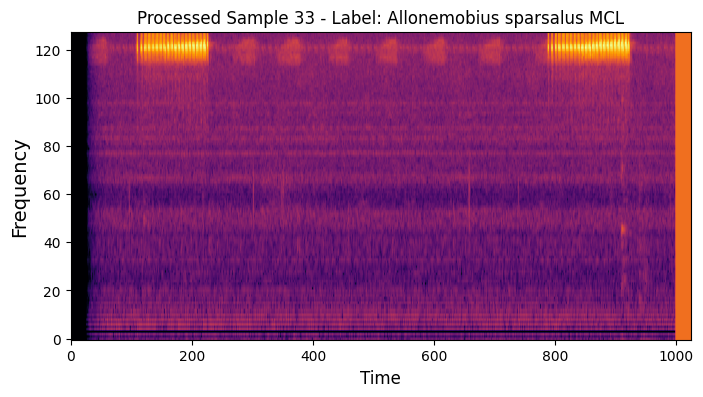

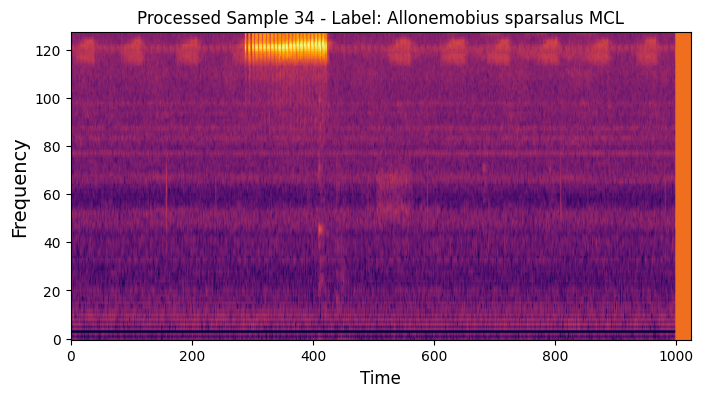

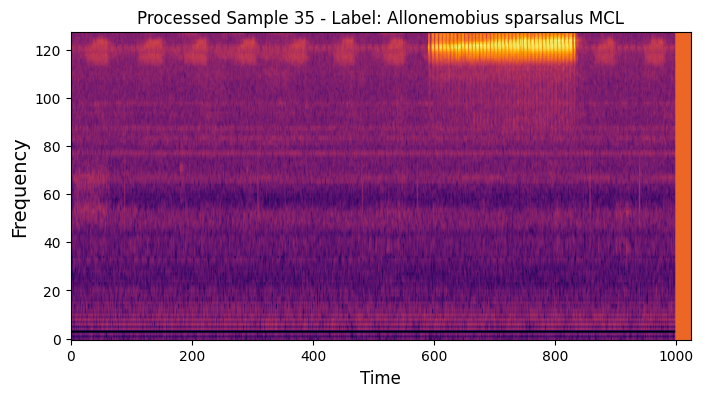

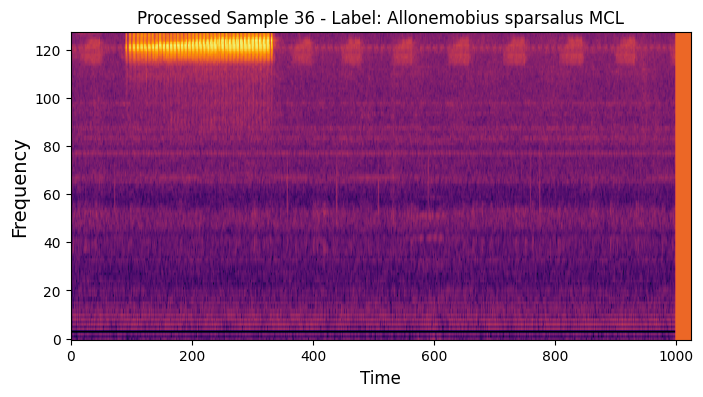

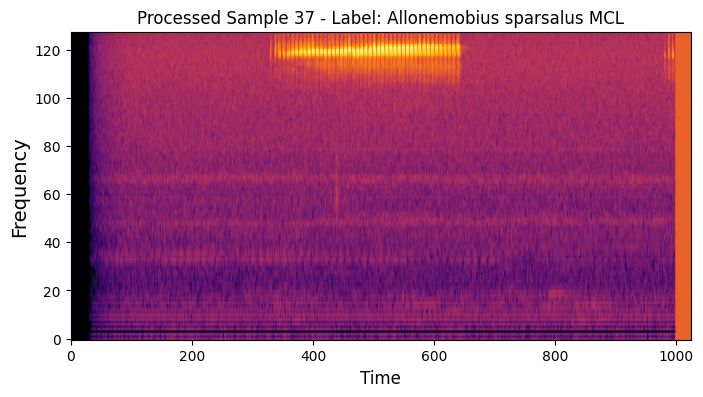

...

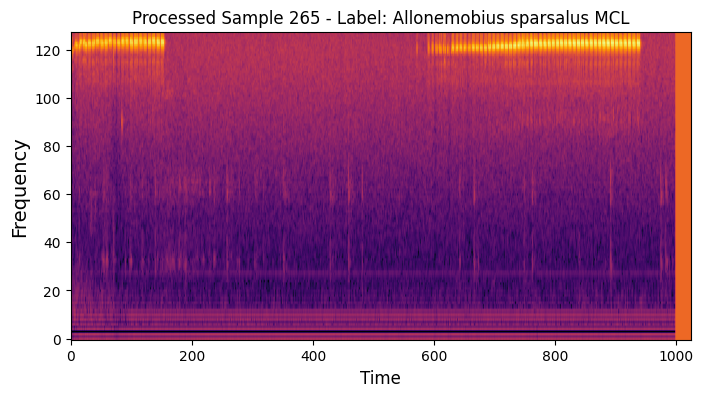

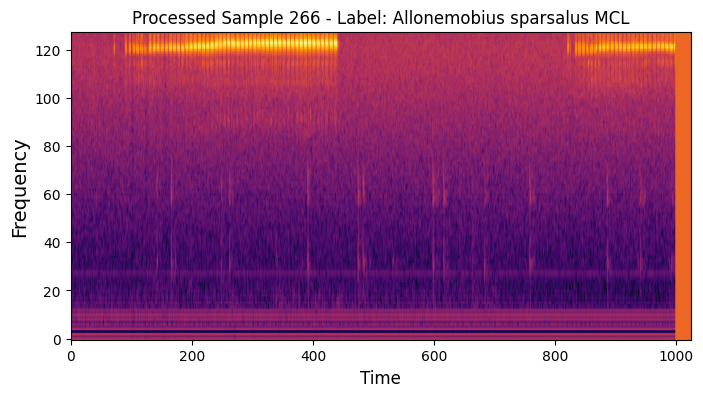

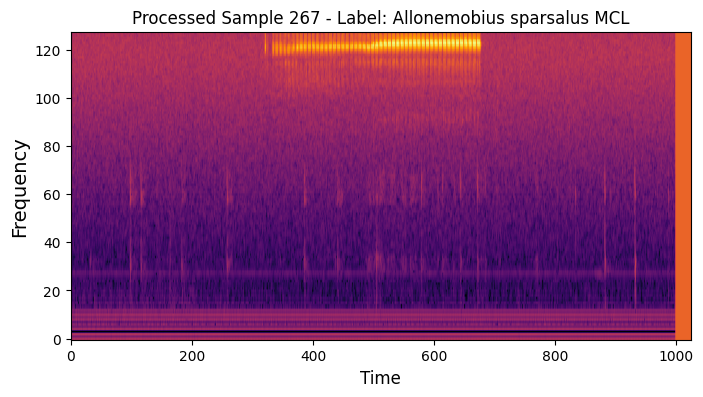

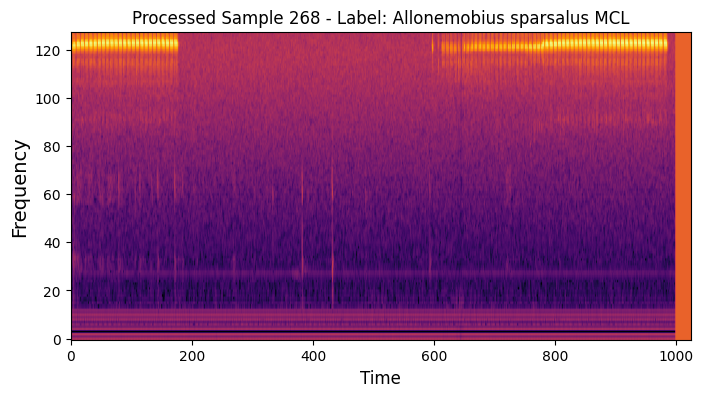

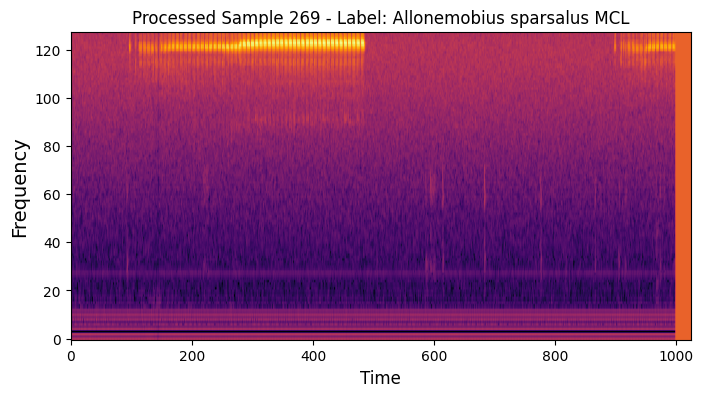

In [79]:
for idx, sample in enumerate(all_processed_samples):
    # Plot the processed sample and idx == 1495:
    if sample['label'] == 'Allonemobius sparsalus MCL':
        plt.figure(figsize=(8, 4))
        plt.imshow(sample['array'].T, cmap='inferno', aspect='auto', origin='lower')
        plt.title(f"Processed Sample {idx} - Label: {sample['label']}")
        plt.xlabel('Time', fontsize=12)
        plt.ylabel('Frequency', fontsize=14)
        

